In [ ]:
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import cPickle as pickle
import numpy as np
import os
import sys
sys.path.insert(1,'/Users/zyzdiana/GitHub/AC297r-Volume-Registration/code')
from utils import clean, res_to_rad

# May_20_Navs

In [3]:
def res_to_voxel(res):
    '''
    converts resolution to its corresponding voxel
    '''
    if('5' in res):
        return 52
    if('6_4' in res):
        return 40
    if('8' in res):
        return 32
    if('10' in res):
        return 26

def get_volumes(res, coil, rot, deg = None):
    '''
    returns a list of 3 repetitions of the given resolution, coil, rotation axis, and degree
    res: resolution
    coil: head or body
    rot: iso, LR or AP
    deg: 1, 3, 5, 7, and 9 degrees
    '''
    if(rot == 'iso'):
        path = 'May_20_Nav/' + res + '/iso/' + coil + '/'
    else:
        path = 'May_20_Nav/' + res + '/' + d + '_' + rot + '/' + coil + '/'
    num_slice = res_to_voxel(res)
    volume = np.empty([num_slice,num_slice,num_slice])
    list_vols = []
    for rep in xrange(3):
        for s in xrange(num_slice):
            file_name = 'EPINavigator_rep_'+str(rep)+'_slice_'+str(s)+'.dat'
            file_path = path + file_name
            if(coil == 'head'):
                slice_ = np.memmap(file_path, dtype=np.complex64, mode='c', shape=(num_slice,4,num_slice))
            if(coil == 'body'):
                slice_ = np.memmap(file_path, dtype=np.complex64, mode='c', shape=(num_slice,1,num_slice))
            slice_ = np.array(np.linalg.norm(slice_,axis=1))                
            volume[s,:,:] = slice_
        list_vols.append(volume)
    return list_vols

In [ ]:
# create a dictionary to store all data
data_dict = {}
# list of resolutions
resolutions = ['5mm','6_4mm','8mm','10mm']
for res in resolutions:
    # Create a sub-dictionary for each resolution
    data_dict[res] = {}
    # create sub-dictionaries for head and body coil
    data_dict[res]['body'] = {}
    data_dict[res]['head'] = {}

    # read in iso of head and body coil
    data_dict[res]['body']['iso'] = get_volumes(res = res, coil = 'body', rot = 'iso')
    data_dict[res]['head']['iso'] = get_volumes(res = res, coil = 'head', rot = 'iso')

    # read in the rotated files of head and body coil
    rot_axes = ['LR','AP']
    degrees = ['1deg','3deg','5deg','7deg','9deg']
    for r in rot_axes:
        data_dict[res]['body'][r] = {}
        data_dict[res]['head'][r] = {}
        for d in degrees:
            data_dict[res]['body'][r][d] = get_volumes(res = res, coil = 'body', rot = r, deg = d)
            data_dict[res]['head'][r][d] = get_volumes(res = res, coil = 'head', rot = r, deg = d)

In [5]:
# save the dictionary
pickle.dump(data_dict,open('data_dict.p','wb'))

In [4]:
def plot_volumes(ls, res, coil, rot, deg = None):
    fig, ax = plt.subplots(3,3)
    fig.set_figheight(10)
    fig.set_figwidth(10)
    for i in xrange(3):
        ax[i][0].imshow(ls[i].max(axis=0), interpolation = 'None')
        ax[i][1].imshow(ls[i].max(axis=1), interpolation = 'None')
        ax[i][2].imshow(ls[i].max(axis=2), interpolation = 'None')
    if(deg == None):
        plt.suptitle(res+'_'+coil+'_'+rot, fontsize=20)
    else:
        plt.suptitle(res+'_'+coil+'_'+rot+'_'+deg, fontsize=20)
    plt.show()
    plt.close(fig)

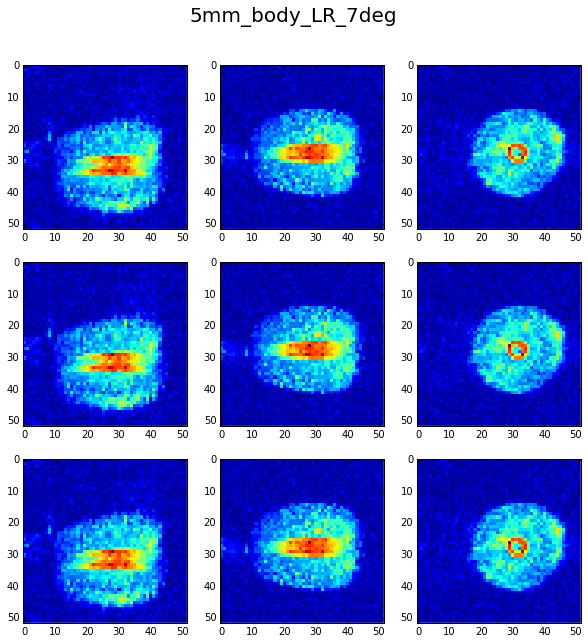

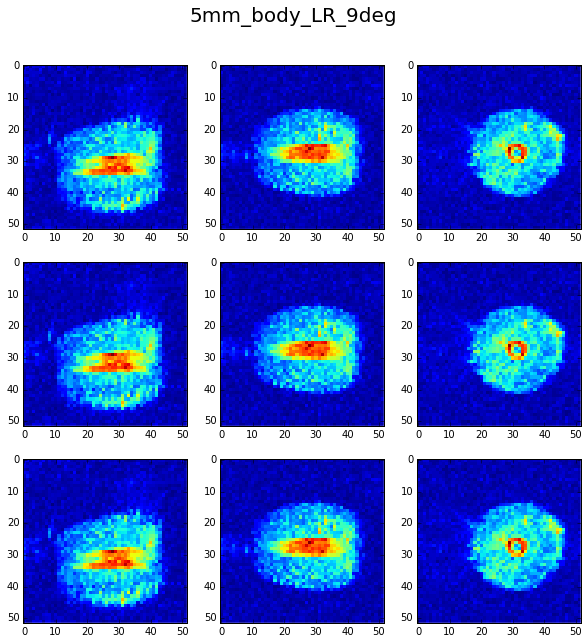

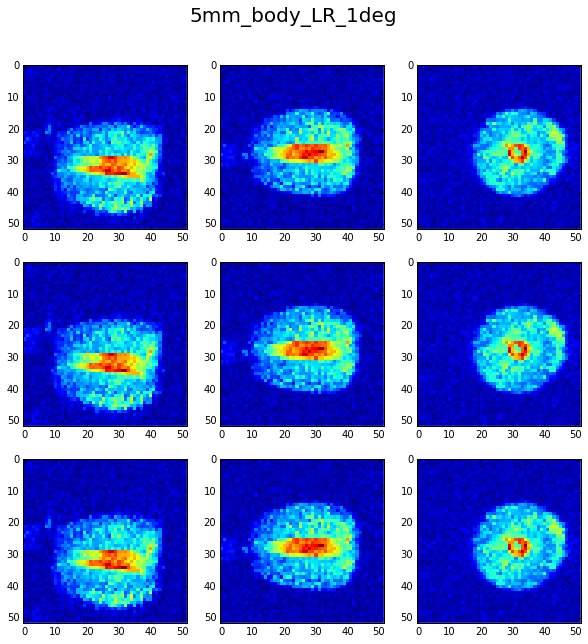

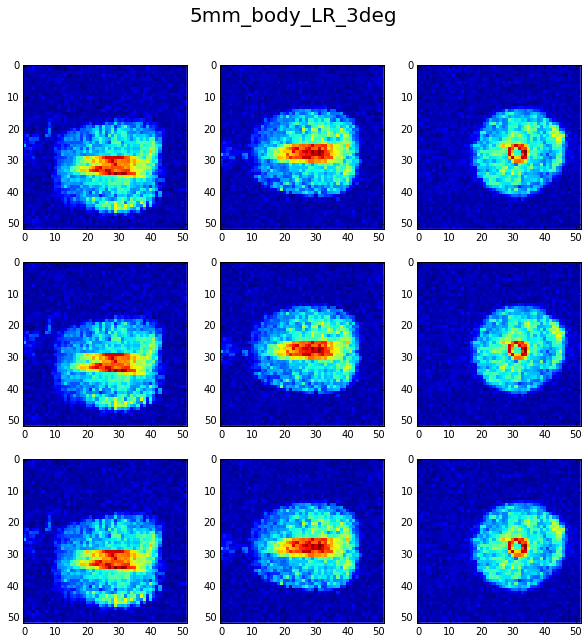

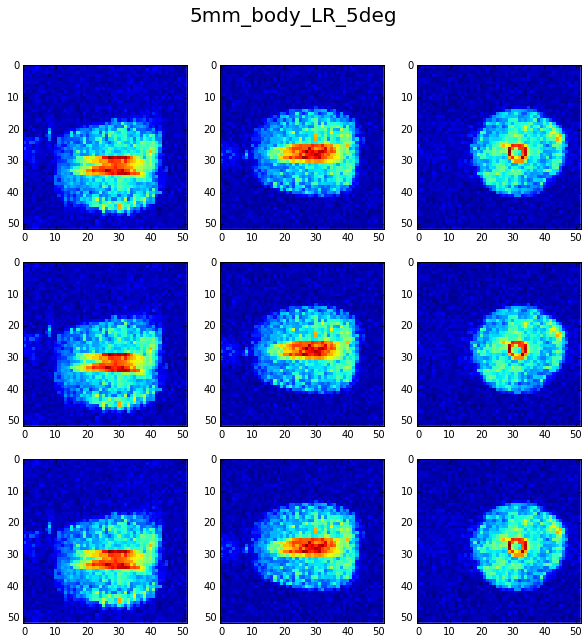

...

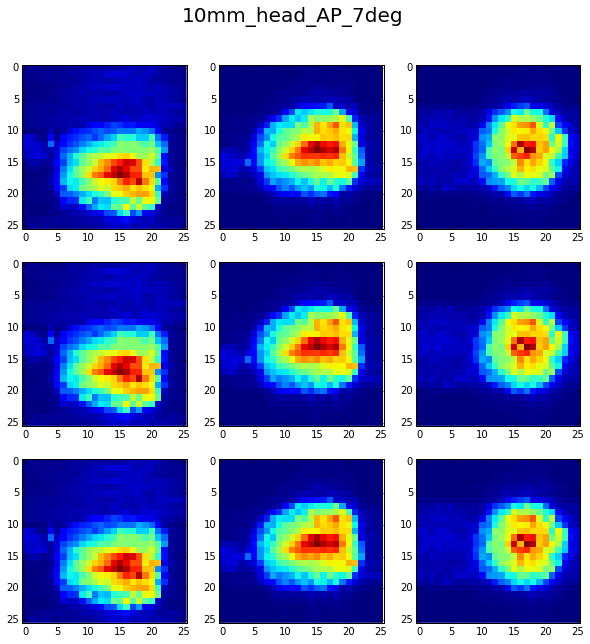

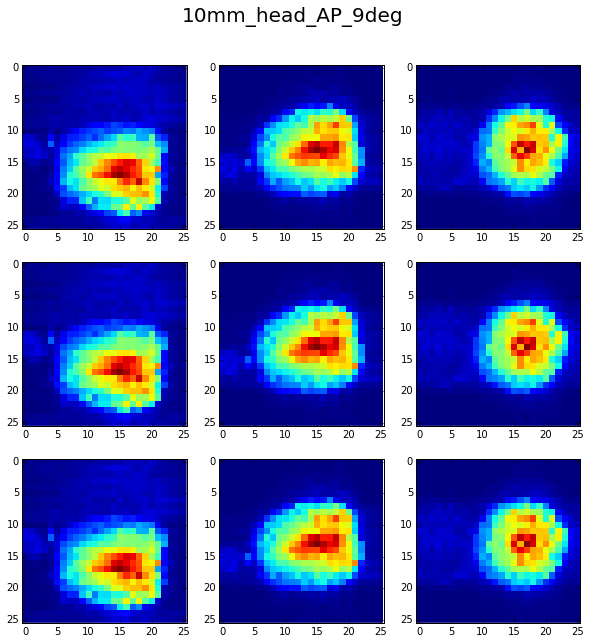

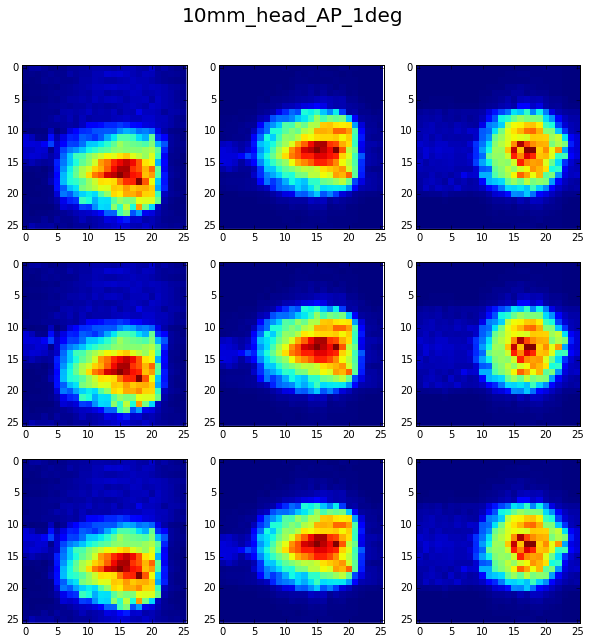

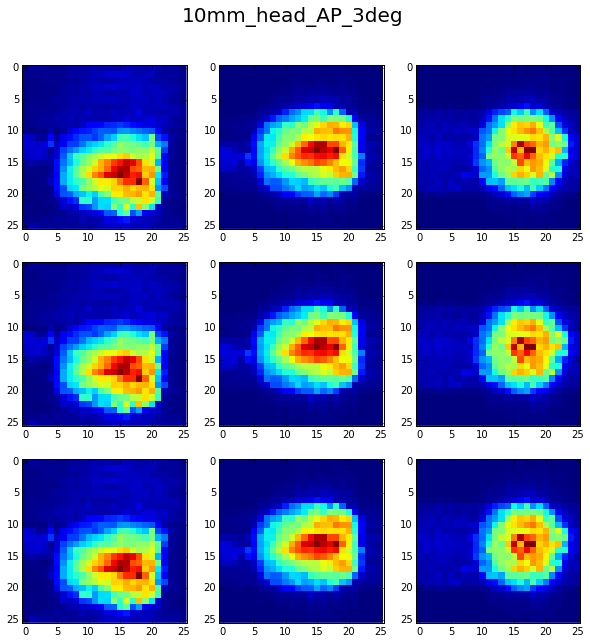

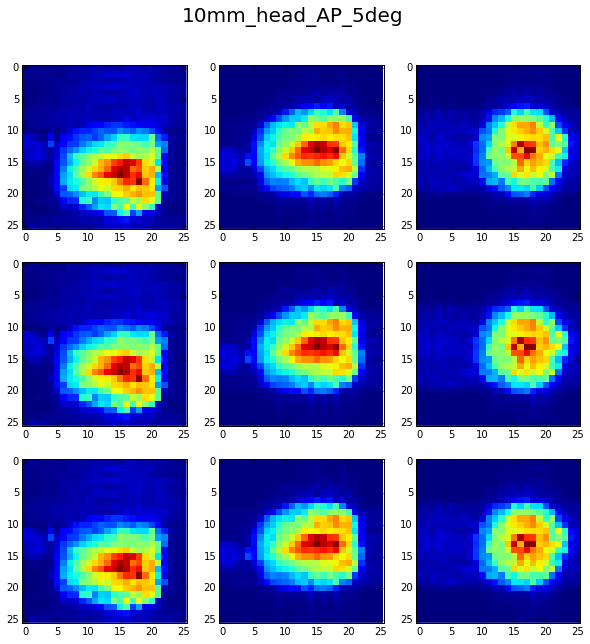

In [10]:
for res, dict_res in data_dict.iteritems():
    for coil, dict_coil in dict_res.iteritems():
        for rot, dict_rot in dict_coil.iteritems():
            if(rot == 'iso'):
                plot_volumes(dict_rot, res, coil, rot)
            else:
                for deg, dict_deg in dict_rot.iteritems():
                    plot_volumes(dict_rot[deg], res, coil, rot, deg)

In [38]:
from data_dict import get_data_dict
dict_3res = get_data_dict()
pickle.dump(dict_3res,open('dict_3res.p','wb'))

# Jul_2_Nav

In [4]:
def get_volumes_head(loc, res, rot, deg = None):
    '''
    returns the volume of given resolution, coil, rotation axis, and degree
    res: resolution
    coil: head or body
    rot: iso, LR or AP
    deg: 1, 3, 5, 7, and 9 degrees
    '''
    num_slice = res_to_voxel(res)
    volume = np.empty([num_slice,num_slice,num_slice])
    for s in xrange(num_slice):
        file_name = res+'_' + rot+'_' + 'body_rep_0_slice_'+str(s)+'.dat'
        file_path = loc + file_name
        slice_ = np.memmap(file_path, dtype=np.complex64, mode='c', shape=(num_slice,1,num_slice))
        slice_ = np.array(np.linalg.norm(slice_,axis=1))                
        volume[s,:,:] = slice_
    return volume

In [13]:
path = '/Users/zyzdiana/Dropbox/THESIS/July_2_Navs/'
files1 = clean(os.listdir(path+ 'run_1'))
files2 = clean(os.listdir(path+ 'run_2'))
print len(files1),len(files2)

882 882


In [5]:
path = '/Users/zyzdiana/Dropbox/THESIS/July_2_Navs/'

# create a dictionary to store all data
data_dict_head = {}
for run in ['run_1','run_2']:
    loc = path + run + '/'
    data_dict_head[run] = {}
    # list of resolutions
    resolutions = ['6_4mm','8mm','10mm']
    for res in resolutions:
        # Create a sub-dictionary for each resolution
        data_dict_head[run][res] = {}

        # read in iso of head and body coil
        data_dict_head[run][res]['iso'] = get_volumes_head(loc, res, rot = 'iso')

        # read in the rotated files of body coil
        rotations = ['0.5RL','1RL','1.5RL','2RL','2.5RL','3RL','4RL','5RL']
        for rot in rotations:
            data_dict_head[run][res][rot] = get_volumes_head(loc, res, rot)

In [6]:
pickle.dump(data_dict_head,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/data_dict_head.p','wb'))

In [5]:
def plot_volumes_head(volume, res, rot='', run = 'run_1'):
    fig, ax = plt.subplots(1,3)
    fig.set_figheight(3)
    fig.set_figwidth(10)
    [ax[i].imshow(volume.max(axis=i), interpolation = 'None',cmap='gray') for i in xrange(3)]
    plt.suptitle(res+'_'+rot, fontsize=20)
    plt.show()
    plt.close(fig)

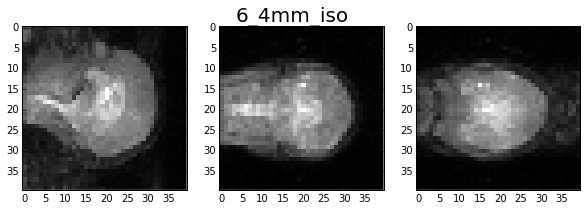

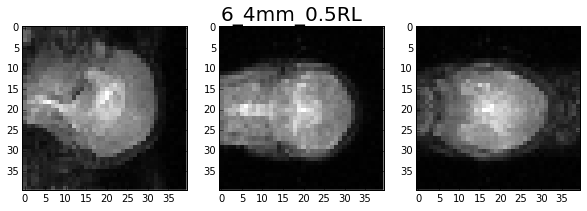

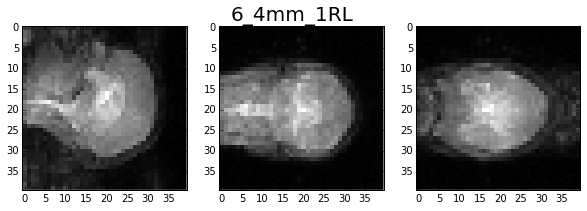

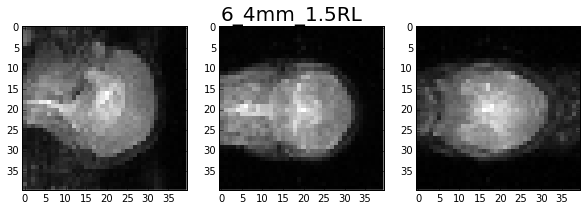

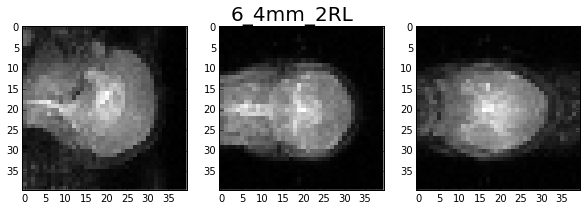

...

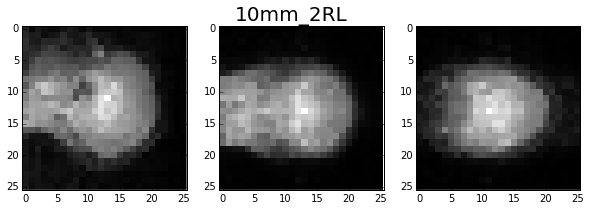

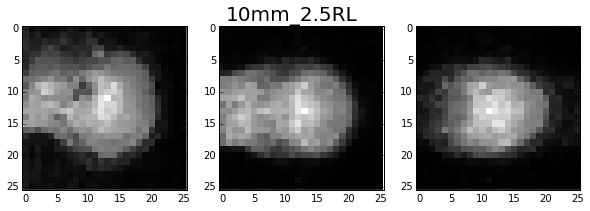

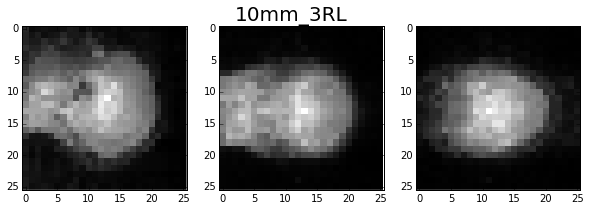

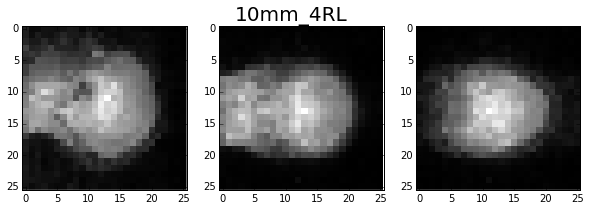

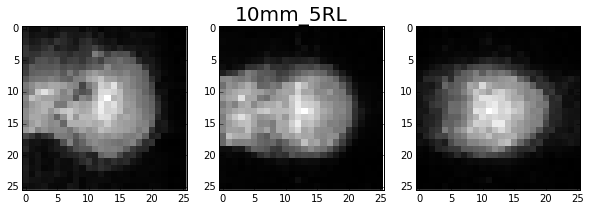

In [29]:
for run in ['run_1','run_2']:
    resolutions = ['6_4mm','8mm','10mm']
    for res in resolutions:
        rotations = ['iso','0.5RL','1RL','1.5RL','2RL','2.5RL','3RL','4RL','5RL']
        for rot in rotations:
            plot_volumes_head(data_dict_head[run][res][rot], res, rot)

In [6]:
def hann(n, radius):
    if n > radius:
        return 0
    else:
        return 0.5 + 0.5 * np.cos((np.pi*n)/float(radius))

def hann_unsafe(n, radius):
    return 0.5 + 0.5 * np.cos((np.pi*n)/float(radius))

def hann_3D_window(volume, radius):
    origin = np.array([(x - 1.0) / 2.0 for x in volume.shape])

    mask = np.array([[[hann(np.linalg.norm(np.array([x,y,z]) - origin), radius) for x in range(volume.shape[0])] for y in range(volume.shape[1])] for z in range(volume.shape[2])])

    return mask * volume

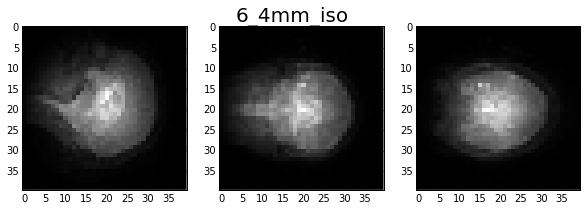

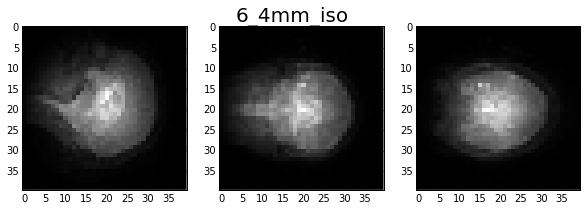

In [34]:
for run in ['run_1','run_2']:
    resolutions = ['6_4mm']
    for res in resolutions:
        rad = res_to_rad(res)*1.2
        rotations = ['iso']#,'0.5RL','1RL','1.5RL','2RL','2.5RL','3RL','4RL','5RL']
        for rot in rotations:
            #plot_volumes_head(data_dict_head[run][res][rot], res, rot)
            plot_volumes_head(hann_3D_window(data_dict_head['run_1'][res]['iso'],rad), res, rot)

30.0


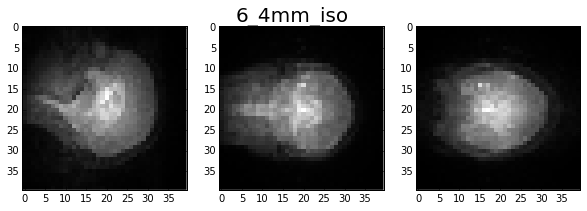

30.0


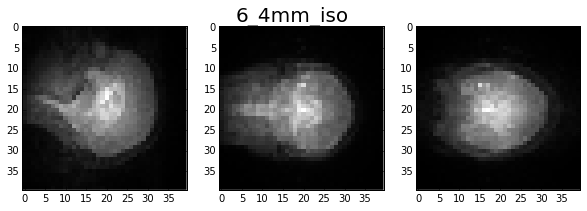

In [38]:
for run in ['run_1','run_2']:
    resolutions = ['6_4mm']
    for res in resolutions:
        rad = res_to_rad(res)*1.5
        print rad
        rotations = ['iso']#,'0.5RL','1RL','1.5RL','2RL','2.5RL','3RL','4RL','5RL']
        for rot in rotations:
            #plot_volumes_head(data_dict_head[run][res][rot], res, rot)
            plot_volumes_head(hann_3D_window(data_dict_head['run_1'][res]['iso'],rad), res, rot)

# Sept_23_Nav

In [22]:
path = '/Users/zyzdiana/Dropbox/THESIS/Sept_23_navs/'
files = clean(os.listdir(path))
print len(files)/(26+32+40)

432


In [1]:
path = '/Users/zyzdiana/Dropbox/THESIS/Sept_23_navs/'
def get_volumes_sept23(res, rot_ax, trans_ax, rep, rot_range):
    '''
    returns the volume of given resolution, coil, rotation axis, and degree
    path: path to where the files are located
    res: resolution
    rot_ax: rotation axes, x, y, z, xy, yz, xz 
    trans_ax: translation axes
    rep: repetition
    '''
    num_slice = res_to_voxel(res)
    volume = np.empty([num_slice,num_slice,num_slice])
    for s in xrange(num_slice):
        if(res == '6_4mm'):
            file_name = '%s_%s_rot_%s_deg_%s_trans_rep_%s_slice_%s.dat'%(res,rot_ax,rot_range,trans_ax,rep,s)
        else:
            file_name = '%s_iso_%s_rot_%s_deg_%s_trans_rep_%s_slice_%s.dat'%(res,rot_ax,rot_range,trans_ax,rep,s)
        slice_ = np.memmap(path+file_name, dtype=np.complex64, mode='c', shape=(num_slice,1,num_slice))
        slice_ = np.array(np.linalg.norm(slice_,axis=1))                
        volume[s,:,:] = slice_
    return volume

In [8]:
def rep_to_angle(rep, rot_range):
    counter = rep % 6
    rotation_angle = 0.0
    translation_step = rep / 6 

    if rot_range == '0_5_to_2_5':
        if(counter != 0):
            rotation_angle = 0.5 * counter
    else: 
        # range = 3.0 to 5.0
        if(counter != 0):
            rotation_angle = 3.0 + (0.5 * (counter - 1))
    return rotation_angle, translation_step

In [5]:
# Get All Axes of Rotations
files = os.listdir(path)
axes_dict = {}
for f in files[1:]:
    rot_ax = f.split('_')[2]
    trans_ax = f.split('_')[10]
    if not axes_dict.has_key(rot_ax):
        axes_dict[rot_ax] = trans_ax
print axes_dict

{'xz': 'xy', 'y': 'z', 'yz': 'xy', 'xy': 'xy', 'x': 'z', 'z': 'z'}


In [9]:
# 6.4mm
ranges = ['0_5_to_2_5','3_0_to_5_0']
sept23_dict_6_4 = {}
res = '6_4mm'
for rot_ax, trans_ax in axes_dict.iteritems():
    sept23_dict_6_4[rot_ax] = {}
    sept23_dict_6_4[rot_ax][trans_ax] = {}
    for rot_range in ranges:
        sept23_dict_6_4[rot_ax][trans_ax][rot_range] = {}
        for rep in xrange(36):
            rot_angle = rep_to_angle(rep,rot_range)
            sept23_dict_6_4[rot_ax][trans_ax][rot_range][rot_angle] = get_volumes_sept23(res, rot_ax, trans_ax, rep, rot_range)

In [10]:
# 8mm
ranges = ['0_5_to_2_5','3_0_to_5_0']
sept23_dict_8 = {}
res = '8mm'
for rot_ax, trans_ax in axes_dict.iteritems():
    sept23_dict_8[rot_ax] = {}
    sept23_dict_8[rot_ax][trans_ax] = {}
    for rot_range in ranges:
        sept23_dict_8[rot_ax][trans_ax][rot_range] = {}
        for rep in xrange(36):
            rot_angle = rep_to_angle(rep,rot_range)
            sept23_dict_8[rot_ax][trans_ax][rot_range][rot_angle] = get_volumes_sept23(res, rot_ax, trans_ax, rep, rot_range)

In [11]:
# 10mm
ranges = ['0_5_to_2_5','3_0_to_5_0']
sept23_dict_10 = {}
res = '10mm'
for rot_ax, trans_ax in axes_dict.iteritems():
    sept23_dict_10[rot_ax] = {}
    sept23_dict_10[rot_ax][trans_ax] = {}
    for rot_range in ranges:
        sept23_dict_10[rot_ax][trans_ax][rot_range] = {}
        for rep in xrange(36):
            rot_angle = rep_to_angle(rep,rot_range)
            sept23_dict_10[rot_ax][trans_ax][rot_range][rot_angle] = get_volumes_sept23(res, rot_ax, trans_ax, rep, rot_range)

In [12]:
pickle.dump(sept23_dict_10,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/sept23_dict_10.p','wb'))
pickle.dump(sept23_dict_8,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/sept23_dict_8.p','wb'))
pickle.dump(sept23_dict_6_4,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/sept23_dict_6_4.p','wb'))

(0.0, 0) xz xy 0_5_to_2_5


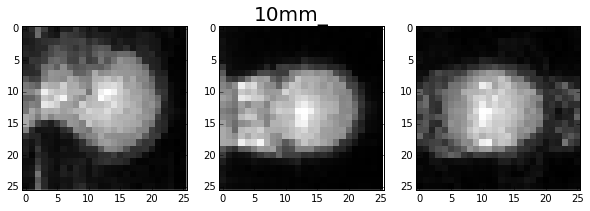

(0.0, 0) xz xy 3_0_to_5_0


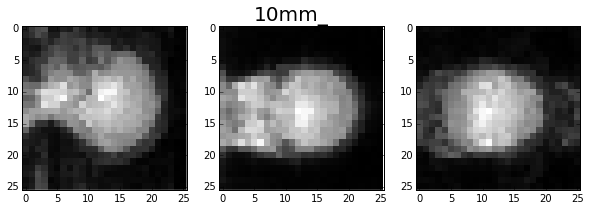

(0.5, 0) xz xy 0_5_to_2_5


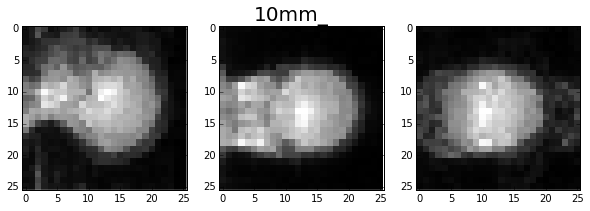

(3.0, 0) xz xy 3_0_to_5_0


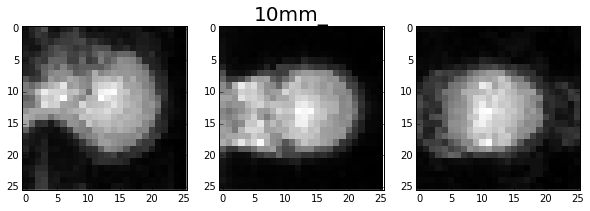

(1.0, 0) xz xy 0_5_to_2_5


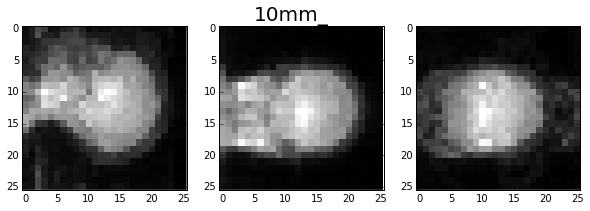

(3.5, 0) xz xy 3_0_to_5_0


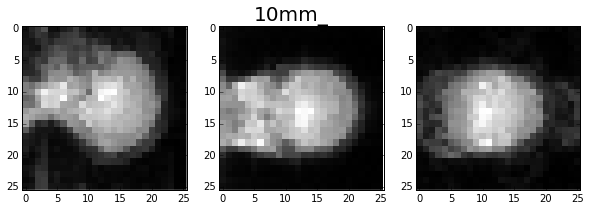

(1.5, 0) xz xy 0_5_to_2_5


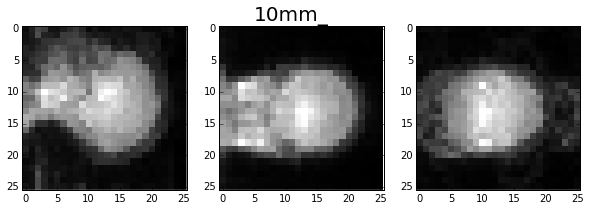

(4.0, 0) xz xy 3_0_to_5_0


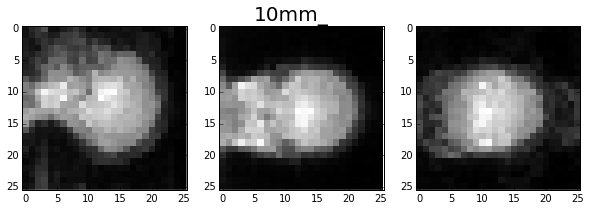

(2.0, 0) xz xy 0_5_to_2_5


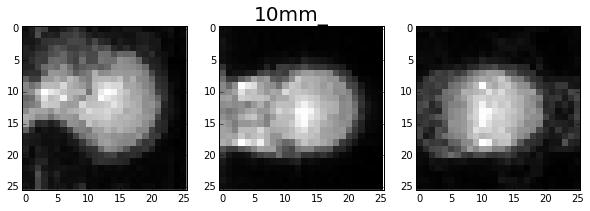

(4.5, 0) xz xy 3_0_to_5_0


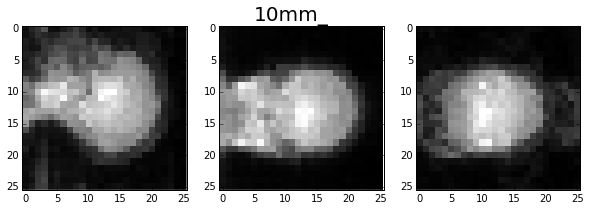

(2.5, 0) xz xy 0_5_to_2_5


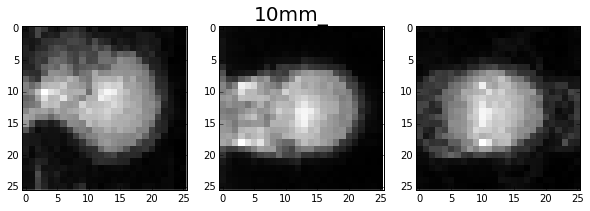

(5.0, 0) xz xy 3_0_to_5_0


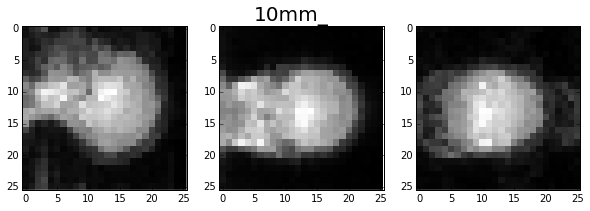

(0.0, 1) xz xy 0_5_to_2_5


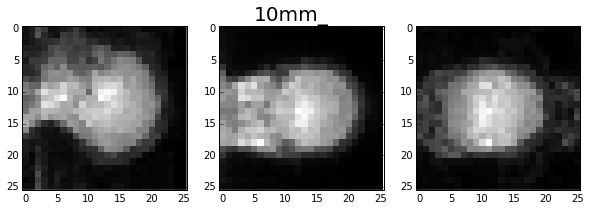

(0.0, 1) xz xy 3_0_to_5_0


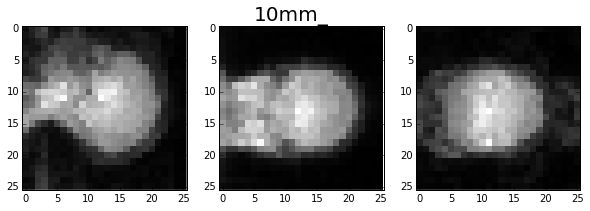

In [14]:
# 10mm
count = 0
ranges = ['0_5_to_2_5','3_0_to_5_0']
for rot_ax, trans_ax in axes_dict.iteritems():
    for rep in xrange(36):
        for rot_range in ranges:
            count += 1
            if count >= 15: break
            rot_angle = rep_to_angle(rep,rot_range)
            print str(rot_angle),rot_ax,trans_ax,rot_range
            plot_volumes_head(sept23_dict_10[rot_ax][trans_ax][rot_range][rot_angle],'10mm')

(0.0, 0) xz xy 0_5_to_2_5


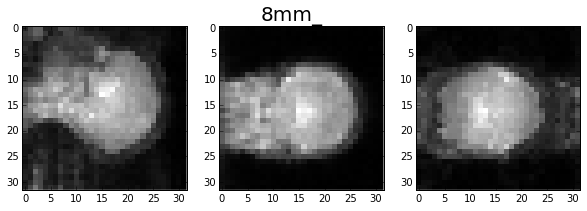

(0.5, 0) xz xy 0_5_to_2_5


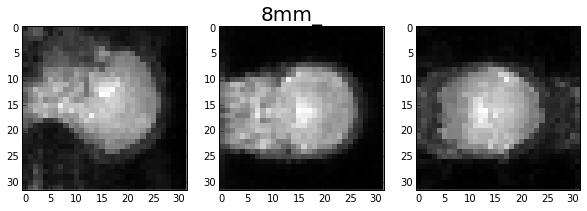

(1.0, 0) xz xy 0_5_to_2_5


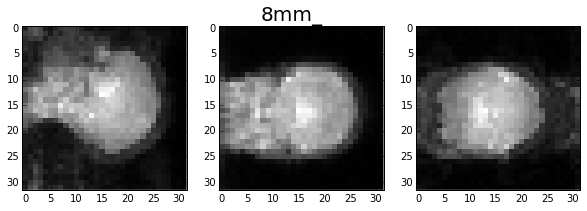

(1.5, 0) xz xy 0_5_to_2_5


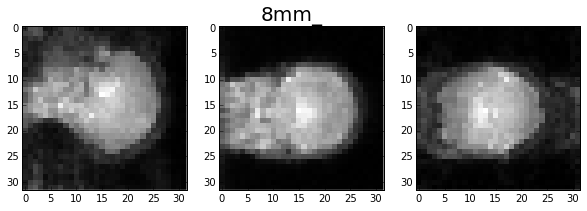

(2.0, 0) xz xy 0_5_to_2_5


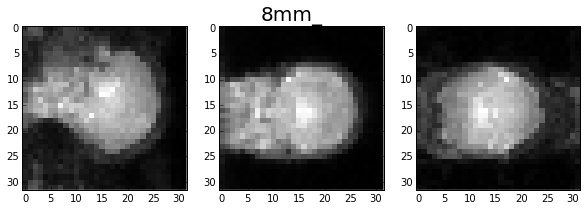

(2.5, 0) xz xy 0_5_to_2_5


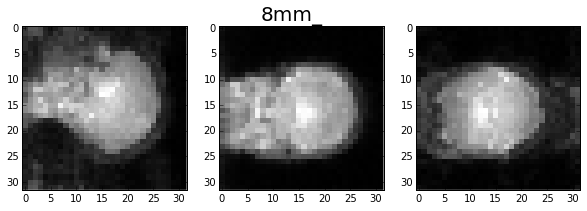

(0.0, 1) xz xy 0_5_to_2_5


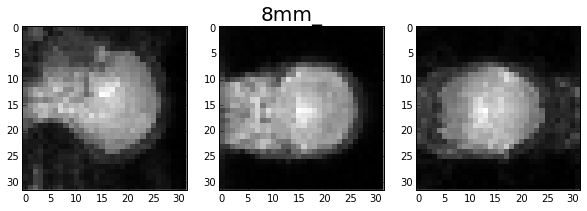

(0.5, 1) xz xy 0_5_to_2_5


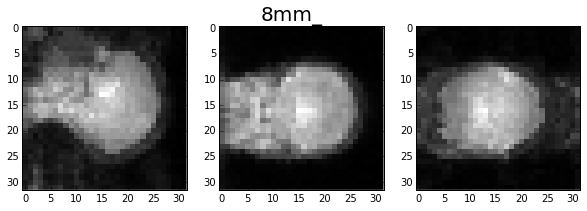

(1.0, 1) xz xy 0_5_to_2_5


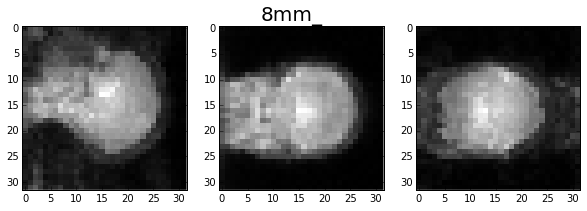

(1.5, 1) xz xy 0_5_to_2_5


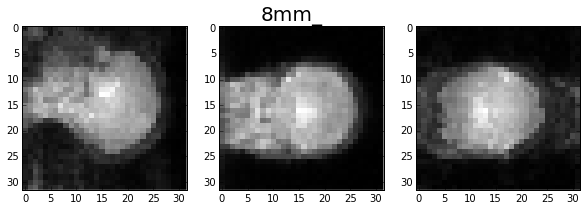

(2.0, 1) xz xy 0_5_to_2_5


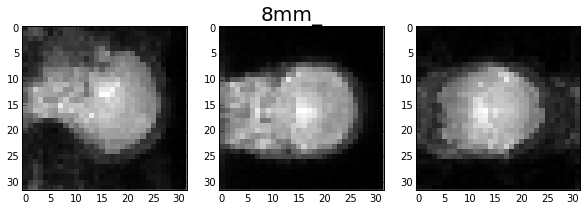

(2.5, 1) xz xy 0_5_to_2_5


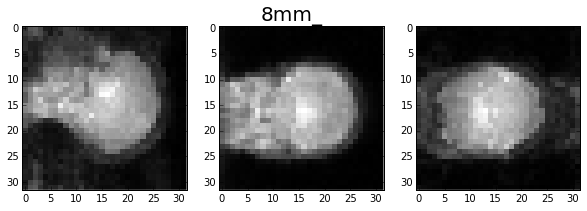

(0.0, 2) xz xy 0_5_to_2_5


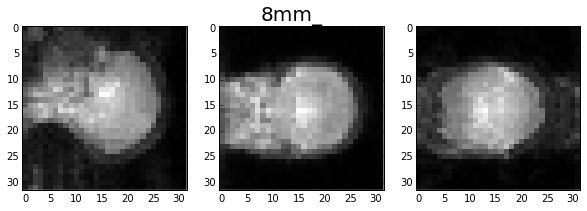

(0.5, 2) xz xy 0_5_to_2_5


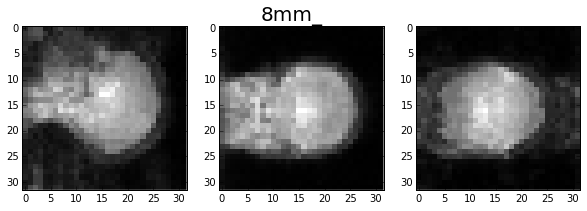

In [16]:
# 6.4mm
count = 0
ranges = ['0_5_to_2_5','3_0_to_5_0']
for rot_ax, trans_ax in axes_dict.iteritems():
    for rot_range in ranges:
        for rep in xrange(36):
            count += 1
            if count >= 15: break
            rot_angle = rep_to_angle(rep,rot_range)
            print str(rot_angle),rot_ax,trans_ax,rot_range
            plot_volumes_head(sept23_dict_8[rot_ax][trans_ax][rot_range][rot_angle],'8mm')

### Dictionary Format: sept23_dict[res][rot_ax][trans_ax][rot_range][degree]

#Oct_13_Navs

In [4]:
path = '/Users/zyzdiana/Dropbox/THESIS/Oct_13_navs/'
file_ls = clean(os.listdir(path))
print len(file_ls)

49392


In [28]:
# Data from Oct 13
print 49392/(32+40+26)
# Data from sept 23
print 42337/(32+40+26) 
# Data from June 8 23
print 56448/(32+40+26) 

504
432
576


In [29]:
path = '/Users/zyzdiana/Dropbox/THESIS/Oct_13_navs/'
file_name = '8mm_iso_x_rot_3_0_to_5_0_deg_z_trans_rep_0_slice_0.dat'
num_slice = 32
test_slice = np.array(np.memmap(path+file_name, dtype=np.complex64, mode='c', shape=(num_slice,1,num_slice)))

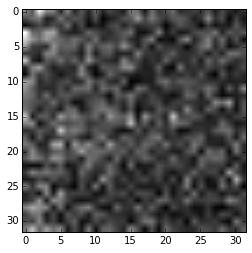

In [30]:
slice_ = np.linalg.norm(test_slice,axis=1)
plt.imshow(slice_,cmap='gray')
plt.show()

In [23]:
path = '/Users/zyzdiana/Dropbox/THESIS/Oct_13_navs/'
def get_volumes_oct13(res, rot_ax, trans_ax, rep, rot_range, trans_5mm = False):
    '''
    returns the volume of given resolution, coil, rotation axis, and degree
    path: path to where the files are located
    res: resolution
    rot_ax: rotation axes, x, y, z, xy, yz, xz 
    trans_ax: translation axes
    rep: repetition
    '''
    num_slice = res_to_voxel(res)
    volume = np.empty([num_slice,num_slice,num_slice])
    if(trans_5mm):
        for s in xrange(num_slice):
            if(res == '6_4mm'):
                file_name = '%s_%s_rot_%s_deg_%s_5mm_trans_rep_%s_slice_%s.dat'%(res,rot_ax,rot_range,trans_ax,rep,s)
            else:
                file_name = '%s_iso_%s_rot_%s_deg_%s_5mm_trans_rep_%s_slice_%s.dat'%(res,rot_ax,rot_range,trans_ax,rep,s)
            slice_ = np.memmap(path+file_name, dtype=np.complex64, mode='c', shape=(num_slice,1,num_slice))
            slice_ = np.array(np.linalg.norm(slice_,axis=1))                
            volume[s,:,:] = slice_
    else:
        for s in xrange(num_slice):
            if(res == '6_4mm'):
                file_name = '%s_%s_rot_%s_deg_%s_trans_rep_%s_slice_%s.dat'%(res,rot_ax,rot_range,trans_ax,rep,s)
            else:
                file_name = '%s_iso_%s_rot_%s_deg_%s_trans_rep_%s_slice_%s.dat'%(res,rot_ax,rot_range,trans_ax,rep,s)
            slice_ = np.memmap(path+file_name, dtype=np.complex64, mode='c', shape=(num_slice,1,num_slice))
            slice_ = np.array(np.linalg.norm(slice_,axis=1))                
            volume[s,:,:] = slice_
        
    return volume

In [35]:
def rep_to_angle(rep, rot_range):
    counter = rep % 6
    rotation_angle = 0.0
    translation_step = rep / 6 

    if rot_range == '0_5_to_2_5':
        if(counter != 0):
            rotation_angle = 0.5 * counter
    else: 
        # range = 3.0 to 5.0
        if(counter != 0):
            rotation_angle = 3.0 + (0.5 * (counter - 1))
    return rotation_angle, translation_step

In [26]:
# Get All Axes of Rotations
# path = '/Users/zyzdiana/Dropbox/THESIS/Oct_13_navs/'
path = '/Users/zyzdiana/Documents/June_8_2016_navs/'
files = os.listdir(path)[1:]
axes_dict = {}
for f in files:
    rot_ax = f.split('_')[2]
    trans_ax = f.split('_')[10]
    if not axes_dict.has_key(rot_ax):
        axes_dict[rot_ax] = trans_ax
print axes_dict

{'xz': 'xy', 'y': 'z', 'yz': 'xy', 'xy': 'xy', 'x': 'z', 'z': 'z'}


In [59]:
axes_dict_5mm_trans = {}
for f in file_ls:
    if '5mm_trans_' in f:
        rot_ax = f.split('_')[2]
        trans_ax = f.split('_')[10]
        if not axes_dict_5mm_trans.has_key(rot_ax):
            axes_dict_5mm_trans[rot_ax] = trans_ax
print axes_dict_5mm_trans

{'yz': 'xy'}


In [50]:
# 6.4mm
ranges = ['0_5_to_2_5','3_0_to_5_0']
oct13_dict_6_4 = {}
res = '6_4mm'
for rot_ax, trans_ax in axes_dict.iteritems():
    oct13_dict_6_4[rot_ax] = {}
    oct13_dict_6_4[rot_ax][trans_ax] = {}
    for rot_range in ranges:
        oct13_dict_6_4[rot_ax][trans_ax][rot_range] = {}
        for rep in xrange(36):
            rot_angle = rep_to_angle(rep,rot_range)
            oct13_dict_6_4[rot_ax][trans_ax][rot_range][rot_angle] = get_volumes_oct13(res, rot_ax, trans_ax, rep, rot_range)

In [49]:
# 8mm
ranges = ['0_5_to_2_5','3_0_to_5_0']
oct13_dict_8 = {}
res = '8mm'
for rot_ax, trans_ax in axes_dict.iteritems():
    oct13_dict_8[rot_ax] = {}
    oct13_dict_8[rot_ax][trans_ax] = {}
    for rot_range in ranges:
        oct13_dict_8[rot_ax][trans_ax][rot_range] = {}
        for rep in xrange(36):
            rot_angle = rep_to_angle(rep,rot_range)
            oct13_dict_8[rot_ax][trans_ax][rot_range][rot_angle] = get_volumes_oct13(res, rot_ax, trans_ax, rep, rot_range)

In [33]:
# 10mm
ranges = ['0_5_to_2_5','3_0_to_5_0']
oct13_dict_10 = {}
res = '10mm'
for rot_ax, trans_ax in axes_dict.iteritems():
    oct13_dict_10[rot_ax] = {}
    oct13_dict_10[rot_ax][trans_ax] = {}
    for rot_range in ranges:
        oct13_dict_10[rot_ax][trans_ax][rot_range] = {}
        for rep in xrange(36):
            rot_angle = rep_to_angle(rep,rot_range)
            oct13_dict_10[rot_ax][trans_ax][rot_range][rot_angle] = get_volumes_oct13(res, rot_ax, trans_ax, rep, rot_range)

In [64]:
# 5mm trans
ranges = ['0_5_to_2_5','3_0_to_5_0']
oct13_dict_5mm_trans = {}
resolutions = ['6_4mm','8mm','10mm']
rot_ax = 'yz'
trans_ax = 'xy'
for res in resolutions:
    oct13_dict_5mm_trans[res] = {}
    oct13_dict_5mm_trans[res][rot_ax] = {}
    oct13_dict_5mm_trans[res][rot_ax][trans_ax] = {}
    for rot_range in ranges:
        oct13_dict_5mm_trans[res][rot_ax][trans_ax][rot_range] = {}
        for rep in xrange(36):
            rot_angle = rep_to_angle(rep,rot_range)
            oct13_dict_5mm_trans[res][rot_ax][trans_ax][rot_range][rot_angle] = get_volumes_oct13(res, rot_ax, trans_ax, rep, rot_range,True)

In [65]:
pickle.dump(oct13_dict_10,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/oct13_dict_10.p','wb'))
pickle.dump(oct13_dict_8,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/oct13_dict_8.p','wb'))
pickle.dump(oct13_dict_6_4,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/oct13_dict_6_4.p','wb'))
pickle.dump(oct13_dict_5mm_trans,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/oct13_dict_5mm_trans.p','wb'))

In [23]:
54+330+432+504

1320

# June 8 2016 Navs

In [5]:
path = '/Users/zyzdiana/Documents/June_8_2016_navs/'
file_ls = clean(os.listdir(path))
print len(file_ls)

56448


In [18]:
for f in file_ls:
    if '15_to_25' in f:
        print f

10mm_iso_x_rot_15_to_25_deg_z_trans_rep_0_slice_0.dat
10mm_iso_x_rot_15_to_25_deg_z_trans_rep_0_slice_1.dat
10mm_iso_x_rot_15_to_25_deg_z_trans_rep_0_slice_10.dat
10mm_iso_x_rot_15_to_25_deg_z_trans_rep_0_slice_11.dat
10mm_iso_x_rot_15_to_25_deg_z_trans_rep_0_slice_12.dat
10mm_iso_x_rot_15_to_25_deg_z_trans_rep_0_slice_13.dat
10mm_iso_x_rot_15_to_25_deg_z_trans_rep_0_slice_14.dat
10mm_iso_x_rot_15_to_25_deg_z_trans_rep_0_slice_15.dat
10mm_iso_x_rot_15_to_25_deg_z_trans_rep_0_slice_16.dat
10mm_iso_x_rot_15_to_25_deg_z_trans_rep_0_slice_17.dat
10mm_iso_x_rot_15_to_25_deg_z_trans_rep_0_slice_18.dat
10mm_iso_x_rot_15_to_25_deg_z_trans_rep_0_slice_19.dat
10mm_iso_x_rot_15_to_25_deg_z_trans_rep_0_slice_2.dat
10mm_iso_x_rot_15_to_25_deg_z_trans_rep_0_slice_20.dat
10mm_iso_x_rot_15_to_25_deg_z_trans_rep_0_slice_21.dat
10mm_iso_x_rot_15_to_25_deg_z_trans_rep_0_slice_22.dat
10mm_iso_x_rot_15_to_25_deg_z_trans_rep_0_slice_23.dat
10mm_iso_x_rot_15_to_25_deg_z_trans_rep_0_slice_24.dat
10mm_iso_x_ro

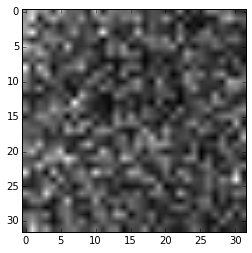

In [6]:
path = '/Users/zyzdiana/Documents/June_8_2016_navs/'
file_name = '8mm_iso_x_rot_3_0_to_5_0_deg_z_trans_rep_0_slice_0.dat'
num_slice = 32
test_slice = np.array(np.memmap(path+file_name, dtype=np.complex64, mode='c', shape=(num_slice,1,num_slice)))

slice_ = np.linalg.norm(test_slice,axis=1)
plt.imshow(slice_,cmap='gray')
plt.show()

In [22]:
path = '/Users/zyzdiana/Documents/June_8_2016_navs/'
def get_volumes_june8(res, rot_ax, trans_ax, rep, rot_range, trans_5mm = False):
    '''
    returns the volume of given resolution, coil, rotation axis, and degree
    path: path to where the files are located
    res: resolution
    rot_ax: rotation axes, x, y, z, xy, yz, xz 
    trans_ax: translation axes
    rep: repetition
    '''
    num_slice = res_to_voxel(res)
    volume = np.empty([num_slice,num_slice,num_slice])
    if(trans_5mm):
        for s in xrange(num_slice):
            if(res == '6_4mm'):
                file_name = '%s_%s_rot_%s_deg_%s_5mm_trans_rep_%s_slice_%s.dat'%(res,rot_ax,rot_range,trans_ax,rep,s)
            else:
                file_name = '%s_iso_%s_rot_%s_deg_%s_5mm_trans_rep_%s_slice_%s.dat'%(res,rot_ax,rot_range,trans_ax,rep,s)
            slice_ = np.memmap(path+file_name, dtype=np.complex64, mode='c', shape=(num_slice,1,num_slice))
            slice_ = np.array(np.linalg.norm(slice_,axis=1))                
            volume[s,:,:] = slice_
    else:
        for s in xrange(num_slice):
            if(res == '6_4mm'):
                file_name = '%s_%s_rot_%s_deg_%s_trans_rep_%s_slice_%s.dat'%(res,rot_ax,rot_range,trans_ax,rep,s)
            else:
                file_name = '%s_iso_%s_rot_%s_deg_%s_trans_rep_%s_slice_%s.dat'%(res,rot_ax,rot_range,trans_ax,rep,s)
            slice_ = np.memmap(path+file_name, dtype=np.complex64, mode='c', shape=(num_slice,1,num_slice))
            slice_ = np.array(np.linalg.norm(slice_,axis=1))                
            volume[s,:,:] = slice_
        
    return volume

In [23]:
# Get All Axes of Rotations
path = '/Users/zyzdiana/Documents/June_8_2016_navs/'
files = clean(os.listdir(path))
axes_dict = {}
for f in files:
    rot_ax = f.split('_')[2]
    trans_ax = f.split('_')[10]
    if not axes_dict.has_key(rot_ax):
        axes_dict[rot_ax] = trans_ax
print axes_dict

{'xz': 'xy', 'y': 'z', 'yz': 'xy', 'xy': 'xy', 'x': 'z', 'z': 'z'}


In [24]:
axes_dict_5mm_trans = {}
for f in file_ls:
    if '5mm_trans_' in f:
        rot_ax = f.split('_')[2]
        trans_ax = f.split('_')[10]
        if not axes_dict_5mm_trans.has_key(rot_ax):
            axes_dict_5mm_trans[rot_ax] = trans_ax
print axes_dict_5mm_trans

{'yz': 'xy'}


In [25]:
def rep_to_angle(rep, rot_range):
    counter = rep % 6
    rotation_angle = 0.0
    translation_step = rep / 6 

    if rot_range == '0_5_to_2_5':
        if(counter != 0):
            rotation_angle = 0.5 * counter
    elif rot_range == '3_0_to_5_0':
        if(counter != 0):
            rotation_angle = 3.0 + (0.5 * (counter - 1))
    elif rot_range == '2_5_to_12_5':
        if(counter != 0):
            rotation_angle = 2.5 + (2.5 * (counter - 1))        
    elif rot_range == '15_to_25':
        if(counter != 0):
            rotation_angle = 15 + (2.5 * (counter - 1))
    else:
        print 'Invalid range of rotation'
    return rotation_angle, translation_step

In [11]:
# 6.4mm
ranges = ['0_5_to_2_5','3_0_to_5_0']
june8_dict_6_4 = {}
res = '6_4mm'
for rot_ax, trans_ax in axes_dict.iteritems():
    june8_dict_6_4[rot_ax] = {}
    june8_dict_6_4[rot_ax][trans_ax] = {}
    for rot_range in ranges:
        june8_dict_6_4[rot_ax][trans_ax][rot_range] = {}
        for rep in xrange(36):
            rot_angle = rep_to_angle(rep,rot_range)
            june8_dict_6_4[rot_ax][trans_ax][rot_range][rot_angle] = get_volumes_june8(res, rot_ax, trans_ax, rep, rot_range)

In [12]:
# 8mm
ranges = ['0_5_to_2_5','3_0_to_5_0']
june8_dict_8 = {}
res = '8mm'
for rot_ax, trans_ax in axes_dict.iteritems():
    june8_dict_8[rot_ax] = {}
    june8_dict_8[rot_ax][trans_ax] = {}
    for rot_range in ranges:
        june8_dict_8[rot_ax][trans_ax][rot_range] = {}
        for rep in xrange(36):
            rot_angle = rep_to_angle(rep,rot_range)
            june8_dict_8[rot_ax][trans_ax][rot_range][rot_angle] = get_volumes_june8(res, rot_ax, trans_ax, rep, rot_range)

In [13]:
# 10mm
ranges = ['0_5_to_2_5','3_0_to_5_0']
june8_dict_10 = {}
res = '10mm'
for rot_ax, trans_ax in axes_dict.iteritems():
    june8_dict_10[rot_ax] = {}
    june8_dict_10[rot_ax][trans_ax] = {}
    for rot_range in ranges:
        june8_dict_10[rot_ax][trans_ax][rot_range] = {}
        for rep in xrange(36):
            rot_angle = rep_to_angle(rep,rot_range)
            june8_dict_10[rot_ax][trans_ax][rot_range][rot_angle] = get_volumes_june8(res, rot_ax, trans_ax, rep, rot_range)

In [26]:
pickle.dump(june8_dict_10,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/june8_dict_10.p','wb'))
pickle.dump(june8_dict_8,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/june8_dict_8.p','wb'))
pickle.dump(june8_dict_6_4,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/june8_dict_6_4.p','wb'))

In [10]:
# Large Rotations
ranges = ['2_5_to_12_5','15_to_25']
june8_dict_large_rot = {}
resolutions = ['6_4mm','8mm','10mm']
rot_ax = 'x'
trans_ax = 'z'
for res in resolutions:
    june8_dict_large_rot[res] = {}
    june8_dict_large_rot[res][rot_ax] = {}
    june8_dict_large_rot[res][rot_ax][trans_ax] = {}
    for rot_range in ranges:
        june8_dict_large_rot[res][rot_ax][trans_ax][rot_range] = {}
        for rep in xrange(36):
            rot_angle = rep_to_angle(rep,rot_range)
            june8_dict_large_rot[res][rot_ax][trans_ax][rot_range][rot_angle] = get_volumes_june8(res, rot_ax, trans_ax, rep, rot_range)

In [11]:
pickle.dump(june8_dict_large_rot,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/june8_dict_large_rot.p','wb'))

In [26]:
# 5mm trans
ranges = ['0_5_to_2_5','3_0_to_5_0']
june8_dict_5mm_trans = {}
resolutions = ['6_4mm','8mm','10mm']
rot_ax = 'yz'
trans_ax = 'xy'
for res in resolutions:
    june8_dict_5mm_trans[res] = {}
    june8_dict_5mm_trans[res][rot_ax] = {}
    june8_dict_5mm_trans[res][rot_ax][trans_ax] = {}
    for rot_range in ranges:
        june8_dict_5mm_trans[res][rot_ax][trans_ax][rot_range] = {}
        for rep in xrange(36):
            rot_angle = rep_to_angle(rep,rot_range)
            june8_dict_5mm_trans[res][rot_ax][trans_ax][rot_range][rot_angle] = get_volumes_june8(res, rot_ax, trans_ax, rep, rot_range,True)

In [27]:
pickle.dump(june8_dict_5mm_trans,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/june8_dict_5mm_trans.p','wb'))

# July 15 Data & July 26 Data

In [6]:
path = '/Users/zyzdiana/Dropbox/THESIS/July_26_2016_Navs/'
file_ls = clean(os.listdir(path))
print len(file_ls)

63504


In [8]:
idx = 0
for f in file_ls:
    if 'PE_AP' in f:
        idx += 1
print idx

3528


In [16]:
def read_PE_RL_data(res, rep, pe = 'AP'):
    rot_ax = 'x'
    rot_range = '2_5_to_12_5'
    trans_ax = 'z'
    num_slice = res_to_voxel(res)
    volume = np.empty([num_slice,num_slice,num_slice])
    for s in xrange(num_slice):
        if(res == '6_4mm'):
            file_name = '%s_%s_rot_%s_deg_%s_trans_PE_%s_rep_%s_slice_%s.dat'%(res,rot_ax,rot_range,trans_ax,pe,rep,s)
        else:
            file_name = '%s_iso_%s_rot_%s_deg_%s_trans_PE_%s_rep_%s_slice_%s.dat'%(res,rot_ax,rot_range,trans_ax,pe,rep,s)
        slice_ = np.memmap(path+file_name, dtype=np.complex64, mode='c', shape=(num_slice,1,num_slice))
        slice_ = np.array(np.linalg.norm(slice_,axis=1))                
        if(pe == 'AP'):
            volume[s,:,:] = slice_
        elif(pe == 'RL'):
            volume[:,s,:] = np.fliplr(slice_)
        else:
            print('Wrong Phase Encoding Direction')
    return volume

In [14]:
volume_PE_RL = read_PE_RL_data('8mm', 0 ,'RL')
volume_PE_AP = read_PE_RL_data('8mm', 0 ,'AP')

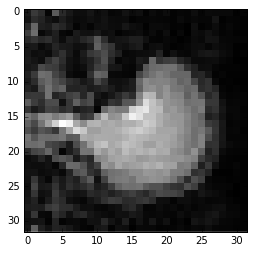

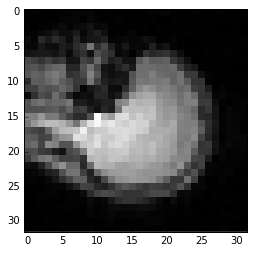

In [21]:
plt.imshow(volume_PE_AP[15,:,:], interpolation = 'None', cmap='gray')
plt.show()
plt.imshow(volume_PE_RL[15,:,:], interpolation = 'None', cmap='gray')
plt.show()

In [17]:
# PE AP Encoding
rot_range = '2_5_to_12_5'
july26_dict_PE_AP = {}
july26_dict_PE_RL = {}
resolutions = ['6_4mm','8mm','10mm']
rot_ax = 'x'
trans_ax = 'z'
for res in resolutions:
    july26_dict_PE_AP[res] = {}
    july26_dict_PE_RL[res] = {}
    july26_dict_PE_AP[res][rot_ax] = {}
    july26_dict_PE_RL[res][rot_ax] = {}
    july26_dict_PE_AP[res][rot_ax][trans_ax] = {}
    july26_dict_PE_RL[res][rot_ax][trans_ax] = {}
    july26_dict_PE_AP[res][rot_ax][trans_ax][rot_range] = {}
    july26_dict_PE_RL[res][rot_ax][trans_ax][rot_range] = {}
    for rep in xrange(36):
        rot_angle = rep_to_angle(rep,rot_range)
        july26_dict_PE_AP[res][rot_ax][trans_ax][rot_range][rot_angle] = read_PE_RL_data(res, rep, 'AP')
        july26_dict_PE_RL[res][rot_ax][trans_ax][rot_range][rot_angle] = read_PE_RL_data(res, rep, 'RL')

In [18]:
pickle.dump(july26_dict_PE_AP,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/july26_dict_PE_AP.p','wb'))
pickle.dump(july26_dict_PE_RL,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/july26_dict_PE_RL.p','wb'))

In [31]:
path = '/Users/zyzdiana/Dropbox/THESIS/July_26_2016_Navs/'
# Get All Axes of Rotations
files = clean(os.listdir(path))
axes_dict = {}
for f in files:
    rot_ax = f.split('_')[2]
    trans_ax = f.split('_')[10]
    if not axes_dict.has_key(rot_ax):
        axes_dict[rot_ax] = trans_ax
print axes_dict

{'xz': 'xy', 'y': 'z', 'yz': 'xy', 'xy': 'xy', 'x': 'z', 'z': 'z'}


In [18]:
# 6.4mm
ranges = ['0_5_to_2_5','3_0_to_5_0']
july15_dict_6_4 = {}
res = '6_4mm'
for rot_ax, trans_ax in axes_dict.iteritems():
    july15_dict_6_4[rot_ax] = {}
    july15_dict_6_4[rot_ax][trans_ax] = {}
    for rot_range in ranges:
        july15_dict_6_4[rot_ax][trans_ax][rot_range] = {}
        for rep in xrange(36):
            rot_angle = rep_to_angle(rep,rot_range)
            july15_dict_6_4[rot_ax][trans_ax][rot_range][rot_angle] = get_volumes_june8(res, rot_ax, trans_ax, rep, rot_range)

In [19]:
# 8mm
ranges = ['0_5_to_2_5','3_0_to_5_0']
july15_dict_8 = {}
res = '8mm'
for rot_ax, trans_ax in axes_dict.iteritems():
    july15_dict_8[rot_ax] = {}
    july15_dict_8[rot_ax][trans_ax] = {}
    for rot_range in ranges:
        july15_dict_8[rot_ax][trans_ax][rot_range] = {}
        for rep in xrange(36):
            rot_angle = rep_to_angle(rep,rot_range)
            july15_dict_8[rot_ax][trans_ax][rot_range][rot_angle] = get_volumes_june8(res, rot_ax, trans_ax, rep, rot_range)

In [20]:
# 10mm
ranges = ['0_5_to_2_5','3_0_to_5_0']
july15_dict_10 = {}
res = '10mm'
for rot_ax, trans_ax in axes_dict.iteritems():
    july15_dict_10[rot_ax] = {}
    july15_dict_10[rot_ax][trans_ax] = {}
    for rot_range in ranges:
        july15_dict_10[rot_ax][trans_ax][rot_range] = {}
        for rep in xrange(36):
            rot_angle = rep_to_angle(rep,rot_range)
            july15_dict_10[rot_ax][trans_ax][rot_range][rot_angle] = get_volumes_june8(res, rot_ax, trans_ax, rep, rot_range)

In [24]:
pickle.dump(july15_dict_10,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/july15_dict_10.p','wb'))
pickle.dump(july15_dict_8,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/july15_dict_8.p','wb'))
pickle.dump(july15_dict_6_4,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/july15_dict_6_4.p','wb'))

In [21]:
pickle.dump(july15_dict_10,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/july26_dict_10.p','wb'))
pickle.dump(july15_dict_8,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/july26_dict_8.p','wb'))
pickle.dump(july15_dict_6_4,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/july26_dict_6_4.p','wb'))

In [22]:
# Large Rotations
ranges = ['2_5_to_12_5','15_to_25']
july15_dict_large_rot = {}
resolutions = ['6_4mm','8mm','10mm']
rot_ax = 'x'
trans_ax = 'z'
for res in resolutions:
    july15_dict_large_rot[res] = {}
    july15_dict_large_rot[res][rot_ax] = {}
    july15_dict_large_rot[res][rot_ax][trans_ax] = {}
    for rot_range in ranges:
        july15_dict_large_rot[res][rot_ax][trans_ax][rot_range] = {}
        for rep in xrange(36):
            rot_angle = rep_to_angle(rep,rot_range)
            july15_dict_large_rot[res][rot_ax][trans_ax][rot_range][rot_angle] = get_volumes_june8(res, rot_ax, trans_ax, rep, rot_range)

In [26]:
pickle.dump(july15_dict_large_rot,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/july15_dict_large_rot.p','wb'))

In [23]:
pickle.dump(july15_dict_large_rot,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/july26_dict_large_rot.p','wb'))

In [35]:
path = '/Users/zyzdiana/Dropbox/THESIS/July_15_2016_Navs/'

In [36]:
# 5mm trans
ranges = ['0_5_to_2_5','3_0_to_5_0']
july15_dict_5mm_trans = {}
resolutions = ['6_4mm','8mm','10mm']
rot_ax = 'yz'
trans_ax = 'xy'
for res in resolutions:
    july15_dict_5mm_trans[res] = {}
    july15_dict_5mm_trans[res][rot_ax] = {}
    july15_dict_5mm_trans[res][rot_ax][trans_ax] = {}
    for rot_range in ranges:
        july15_dict_5mm_trans[res][rot_ax][trans_ax][rot_range] = {}
        for rep in xrange(36):
            rot_angle = rep_to_angle(rep,rot_range)
            july15_dict_5mm_trans[res][rot_ax][trans_ax][rot_range][rot_angle] = get_volumes_june8(res, rot_ax, trans_ax, rep, rot_range,True)

In [37]:
pickle.dump(july15_dict_5mm_trans,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/july15_dict_5mm_trans.p','wb'))

In [34]:
pickle.dump(july15_dict_5mm_trans,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/july26_dict_5mm_trans.p','wb'))

# Jan_26_2016_Navs

In [25]:
path = '/Users/zyzdiana/Dropbox/THESIS/Jan_26_2016_Navs/'
def get_volumes_jan26(res, rot_ax, trans_ax, rep, rot_range):
    '''
    returns the volume of given resolution, coil, rotation axis, and degree
    path: path to where the files are located
    res: resolution
    rot_ax: rotation axes, x, y, z, xy, yz, xz 
    trans_ax: translation axes
    rep: repetition
    '''
    num_slice = res_to_voxel(res)
    volume = np.empty([num_slice,num_slice,num_slice])
    volume_open = np.empty([num_slice,num_slice,num_slice])
    for s in xrange(num_slice):
        if(res == '6_4mm'):
            file_name = '%s_%s_rot_%s_deg_%s_trans_rep_%s_slice_%s.dat'%(res,rot_ax,rot_range,trans_ax,rep,s)
        else:
            file_name = '%s_iso_%s_rot_%s_deg_%s_trans_rep_%s_slice_%s.dat'%(res,rot_ax,rot_range,trans_ax,rep,s)
        slice_ = np.memmap(path+file_name, dtype=np.complex64, mode='c', shape=(num_slice,1,num_slice))
        slice_ = np.array(np.linalg.norm(slice_,axis=1))                
        volume[s,:,:] = slice_
            
        file_name_open = 'open_' + file_name
        slice_open = np.memmap(path+file_name_open, dtype=np.complex64, mode='c', shape=(num_slice,1,num_slice))
        slice_open = np.array(np.linalg.norm(slice_open,axis=1))                
        volume_open[s,:,:] = slice_open
    return [volume, volume_open]

In [51]:
def plot_volume(volume, title = ""):
    fig, ax = plt.subplots(1,3)
    fig.set_figheight(3)
    fig.set_figwidth(10)

    [ax[i].imshow(volume.max(axis=i), interpolation = 'None', cmap = 'gray') for i in xrange(3)]
    plt.suptitle(title)
    plt.show()
    plt.close(fig)

In [20]:
# Get All Axes of Rotations
path = '/Users/zyzdiana/Dropbox/THESIS/Jan_26_2016_Navs/'
files = os.listdir(path)
axes_dict = {}
for f in files:
    if('open' in f):
        rot_ax = f.split('_')[3]
        trans_ax = f.split('_')[11]
    else:
        rot_ax = f.split('_')[2]
        trans_ax = f.split('_')[10]
    if not axes_dict.has_key(rot_ax):
        axes_dict[rot_ax] = trans_ax
print axes_dict

{'y': 'z', 'x': 'z', 'z': 'z'}


In [26]:
# 6.4mm
ranges = ['0_5_to_2_5','3_0_to_5_0']
jan26_dict_6_4 = {}
res = '6_4mm'
for rot_ax, trans_ax in axes_dict.iteritems():
    jan26_dict_6_4[rot_ax] = {}
    jan26_dict_6_4[rot_ax][trans_ax] = {}
    for rot_range in ranges:
        jan26_dict_6_4[rot_ax][trans_ax][rot_range] = {}
        for rep in xrange(36):
            rot_angle = rep_to_angle(rep,rot_range)
            jan26_dict_6_4[rot_ax][trans_ax][rot_range][rot_angle] = get_volumes_jan26(res, rot_ax, trans_ax, rep, rot_range)

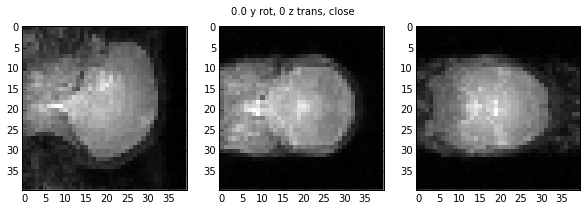

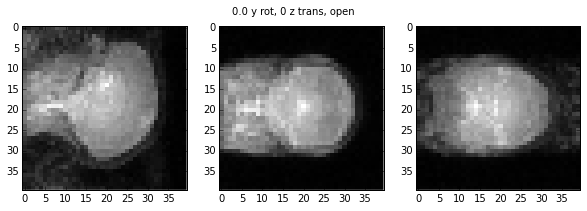

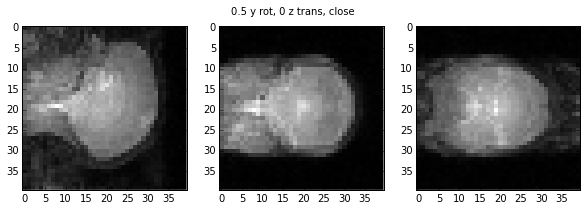

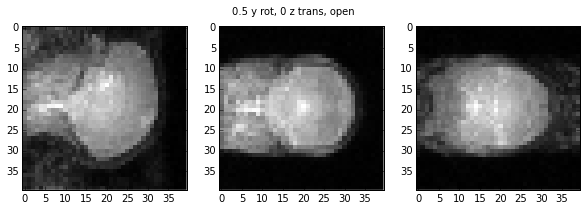

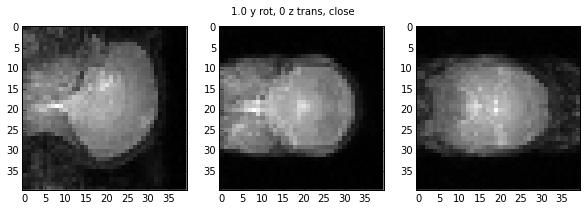

...

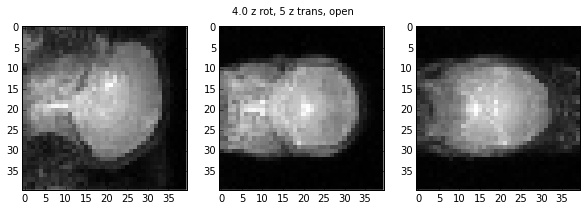

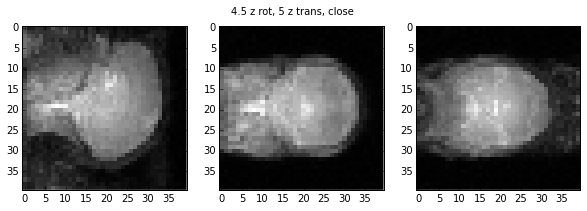

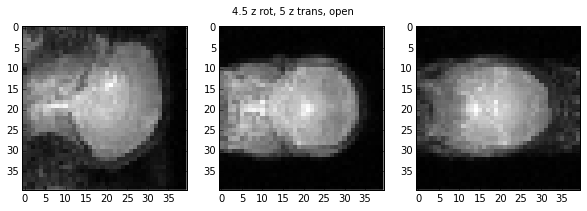

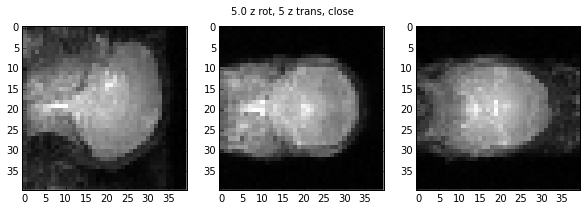

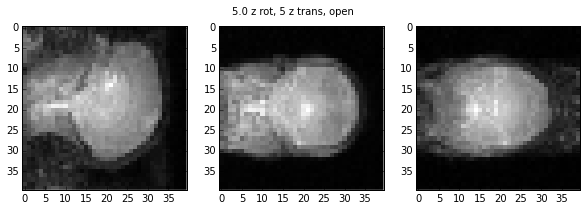

In [52]:
for rot_ax, trans_ax in axes_dict.iteritems():
    for rot_range in ranges:
        for rep in xrange(36):
            rot_angle = rep_to_angle(rep,rot_range)
            vol1 = jan26_dict_6_4[rot_ax][trans_ax][rot_range][rot_angle][0]
            plot_volume(vol1,"%s %s rot, %s z trans, close" % (str(rot_angle[0]), rot_ax, str(rot_angle[1])))
            vol2 = jan26_dict_6_4[rot_ax][trans_ax][rot_range][rot_angle][1]
            plot_volume(vol2,"%s %s rot, %s z trans, open" % (str(rot_angle[0]), rot_ax, str(rot_angle[1])))

In [46]:
# 8mm
ranges = ['0_5_to_2_5','3_0_to_5_0']
jan26_dict_8 = {}
res = '8mm'
for rot_ax, trans_ax in axes_dict.iteritems():
    jan26_dict_8[rot_ax] = {}
    jan26_dict_8[rot_ax][trans_ax] = {}
    for rot_range in ranges:
        jan26_dict_8[rot_ax][trans_ax][rot_range] = {}
        for rep in xrange(36):
            rot_angle = rep_to_angle(rep,rot_range)
            jan26_dict_8[rot_ax][trans_ax][rot_range][rot_angle] = get_volumes_jan26(res, rot_ax, trans_ax, rep, rot_range)

In [47]:
# 10mm
ranges = ['0_5_to_2_5','3_0_to_5_0']
jan26_dict_10 = {}
res = '10mm'
for rot_ax, trans_ax in axes_dict.iteritems():
    jan26_dict_10[rot_ax] = {}
    jan26_dict_10[rot_ax][trans_ax] = {}
    for rot_range in ranges:
        jan26_dict_10[rot_ax][trans_ax][rot_range] = {}
        for rep in xrange(36):
            rot_angle = rep_to_angle(rep,rot_range)
            jan26_dict_10[rot_ax][trans_ax][rot_range][rot_angle] = get_volumes_jan26(res, rot_ax, trans_ax, rep, rot_range)

In [48]:
pickle.dump(jan26_dict_10,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/jan26_dict_10.p','wb'))
pickle.dump(jan26_dict_8,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/jan26_dict_8.p','wb'))
pickle.dump(jan26_dict_6_4,open('/Users/zyzdiana/Dropbox/THESIS/Pickled_Results/jan26_dict_6_4.p','wb'))

In [ ]:
def get_volume(res, rot_ax, rang_id, rot_angle):
    if('10' in res): dict_ = oct13_dict_10
    if('8' in res): dict_ = oct13_dict_8
    if('6_4' in res): dict_ = oct13_dict_6_4
    rad = res_to_rad(res)
    vol = dict_[rot_ax][axes_dict[rot_ax]][ranges[rang_id]][rot_angle]
    vol_filtered = abs(fft.ifftn(fft.ifftshift(sphere_mask(fft.fftshift(fft.fftn(vol)),rad))))
    return sphere_mask(vol_filtered,rad)